## HACKER EARTH - On The Plague Trail

 https://www.kaggle.com/shivammittal99/hackerearth-on-the-plague-trail

Predict the total number of people infected by the 7 different pathogens.

Plague is an epidemic event caused by Bacteria. A group of senior scientists misplaced a package containing fatal plague bacteria during one of their trips. With no means of tracking where the package is, scientists are now trying to come up with a solution to stop the plague. This plague has 7 different strains that are unique for each continent. This strain is expanding rapidly in each continent.

The dataset contains escalations of the plague for all the seven strains. The dataset is a time series in which the training set contains the number of individuals that are infected by the plague over a defined period of time.

Your mission, should you choose to accept it, is to defend the world against this plague by building an algorithm that can minimize the damage.

### No. Column Label Column Description

1.ID - A calculated unique ID for each research.

2.DateTime - Represents the data and time on which the event is recorded

3.TempOut - Outside Temperature

4.HiTemp - Highest Temperature

5.LowTemp - Lowest Temperature

6.OutHum - Outside Humidity

7.DewPt - Dew Point

8.WindSpeed - Wind Speed

9.WindDir - Wind Direction

10.WindRun - Wind Run Flow

11.HiSpeed - Highest Speed of the wind

12.HiDir - Direction of the wind which has highest speed

13.WindChill - Chillness of the wind

14.HeatIndex - Heat Index

15.THWIndex - THW Index

16.Bar - Barometer Reading

17.Rain - Rain

18.RainRate - Frequency of Rain

19.HeatDD - Heat DD

20.CoolDD - Cool DD

21.InTemp - Temperature Inside

22.InHum - Humidity Inside

23.InDew - Dew Inside

24.InHeat - Heat Inside

25.InEMC - EMC Inside

26.InAirDensity - Air Density

27.WindSamp - Wind - Attribute 1

28.WindTx - Wind - Attribute 2

29.ISSRecpt - Reception

30.ArcInt - Attribute

31.PA - Total No of People infected by Pathogen A

32.PB - Total No of People infected by Pathogen B

33.PC - Total No of People infected by Pathogen C

34.PD - Total No of People infected by Pathogen D

35.PE - Total No of People infected by Pathogen E

36.PF - Total No of People infected by Pathogen F

37.PG - Total No of People infected by Pathogen G

#### What to do
Given is the train data where based on the features, no. of people infected by Pathogen A,B,C,D,E,F,G are given. A model has to be built and trained with the data provided such that for a given set of conditions/features(test) it has to predict the no. of people that will get infected due to Pathogen A,B,C,D,E,F,G accurately.

As we have to predict the number of people infected due to the Pathogens this is a Regression Problem.

Root Mean Squared Error : Used to measure the differences between actual and predicted values.

RMSE = sqrt(mean(actual-predicted)^2)

#### Evaluation based on Root Mean Squared Error (RMSE).

score = max(0,(100 - rmse))

##### Importing required libraries

In [2]:
import keras
from keras.datasets import cifar10
from keras.models import Model, Sequential
from keras.layers import Dense, Dropout, Flatten, Input, AveragePooling2D, merge, Activation
from keras.layers import Conv2D, MaxPooling2D, BatchNormalization
from keras.layers import Concatenate
from keras.optimizers import Adam
from tensorflow.keras import models, layers
from tensorflow.keras.models import Model
from tensorflow.keras.layers import BatchNormalization, Activation, Flatten
from tensorflow.keras.optimizers import Adam,RMSprop
from keras.preprocessing.image import ImageDataGenerator
from keras import regularizers
from keras.callbacks import LearningRateScheduler
import numpy as np
import pandas as pd

Using TensorFlow backend.


#### Reading Train Data into a dataframe

In [2]:
data_train=pd.read_csv("train.csv")
print(data_train.columns)

Index(['ID', 'DateTime', 'TempOut', 'HiTemp', 'LowTemp', 'OutHum', 'DewPt',
       'WindSpeed', 'WindDir', 'WindRun', 'HiSpeed', 'HiDir', 'WindChill',
       'HeatIndex', 'THWIndex', 'Bar', 'Rain', 'RainRate', 'HeatDD', 'CoolDD',
       'InTemp', 'InHum', 'InDew', 'InHeat', 'InEMC', 'InAirDensity',
       'WindSamp', 'WindTx', 'ISSRecpt', 'ArcInt', 'PA', 'PB', 'PC', 'PD',
       'PE', 'PF', 'PG'],
      dtype='object')


In [3]:
print(data_train.head(5))

        ID         DateTime  TempOut  HiTemp  LowTemp  OutHum  DewPt  \
0  PR00001  07/12/2040 0:15     53.5    53.6     53.5      85   49.1   
1  PR00002  07/12/2040 0:30     53.5    53.5     53.4      85   49.1   
2  PR00003  07/12/2040 0:45     53.3    53.5     53.2      85   48.9   
3  PR00004  07/12/2040 1:00     53.1    53.3     53.0      86   49.0   
4  PR00005  07/12/2040 1:15     52.9    53.1     52.9      86   48.8   

   WindSpeed WindDir  WindRun  ...  WindTx ISSRecpt  ArcInt  PA  PB  PC  PD  \
0          2     SSE      0.5  ...       1    100.0      15   1   1   1   1   
1          2     SSE      0.5  ...       1    100.0      15   1   1   1   1   
2          2     SSE      0.5  ...       1    100.0      15   1   1   1   1   
3          2       S      0.5  ...       1    100.0      15   1   1   1   1   
4          2       S      0.5  ...       1    100.0      15   1   1   1   1   

   PE  PF  PG  
0   1   1   1  
1   1   1   1  
2   1   1   1  
3   1   1   1  
4   1   1   

In [4]:
print(data_train.shape)

(40000, 37)


#### Reading Test data into a dataframe

In [5]:
data_test=pd.read_csv("test.csv")
print(data_test.columns)

Index(['ID', 'DateTime', 'TempOut', 'HiTemp', 'LowTemp', 'OutHum', 'DewPt',
       'WindSpeed', 'WindDir', 'WindRun', 'HiSpeed', 'HiDir', 'WindChill',
       'HeatIndex', 'THWIndex', 'Bar', 'Rain', 'RainRate', 'HeatDD', 'CoolDD',
       'InTemp', 'InHum', 'InDew', 'InHeat', 'InEMC', 'InAirDensity',
       'WindSamp', 'WindTx', 'ISSRecpt', 'ArcInt'],
      dtype='object')


In [6]:
print(data_test.head(5))

        ID          DateTime  TempOut  HiTemp  LowTemp  OutHum  DewPt  \
0  PR40001  08-04-2041 11:30     82.6    83.6     80.8      38   54.4   
1  PR40002  08-04-2041 11:45     82.6    83.2     82.1      36   52.9   
2  PR40003  08-04-2041 12:00     83.6    84.5     82.4      38   55.3   
3  PR40004  08-04-2041 12:15     85.1    85.5     83.4      37   55.9   
4  PR40005  08-04-2041 12:30     86.5    87.3     85.1      37   57.1   

   WindSpeed WindDir  WindRun  ...  InTemp InHum  InDew  InHeat  InEMC  \
0          4     SSE      1.0  ...    68.3    29   34.8    64.6   6.08   
1          4       S      1.0  ...    69.3    58   53.9    68.5  10.75   
2          4       S      1.0  ...    68.4    30   35.7    64.8   6.25   
3          4       S      1.0  ...    69.9    56   53.5    68.7  10.35   
4          4     SSE      1.0  ...    68.5    67   57.1    68.7  12.38   

   InAirDensity  WindSamp  WindTx  ISSRecpt  ArcInt  
0        0.0748       351       1     100.0      15  
1       

In [7]:
print(data_test.shape)

(22446, 30)


#### Converting datatime format, adding Year, Month, Day & sorting train and test data

In [8]:
cols = ['Date' if x=='DateTime' else x for x in list(data_train.columns)]

data_train['Date']=pd.to_datetime(data_train['DateTime'])
data_train.drop(['DateTime'],axis=1,inplace=True)
data_train.sort_values(by=['Date'],inplace=True)

In [9]:
cols = ['Date' if x=='DateTime' else x for x in list(data_test.columns)]

data_test['Date']=pd.to_datetime(data_test['DateTime'])
data_test.drop(['DateTime'],axis=1,inplace=True)
data_test.sort_values(by=['Date'],inplace=True)

In [10]:
data_train['Year'] = data_train['Date'].dt.year
data_train['Month'] = data_train['Date'].dt.month
data_train['Day'] = data_train['Date'].dt.day

In [11]:
data_test['Year'] = data_test['Date'].dt.year
data_test['Month'] = data_test['Date'].dt.month
data_test['Day'] = data_test['Date'].dt.day

In [12]:
print(data_train.columns)

Index(['ID', 'TempOut', 'HiTemp', 'LowTemp', 'OutHum', 'DewPt', 'WindSpeed',
       'WindDir', 'WindRun', 'HiSpeed', 'HiDir', 'WindChill', 'HeatIndex',
       'THWIndex', 'Bar', 'Rain', 'RainRate', 'HeatDD', 'CoolDD', 'InTemp',
       'InHum', 'InDew', 'InHeat', 'InEMC', 'InAirDensity', 'WindSamp',
       'WindTx', 'ISSRecpt', 'ArcInt', 'PA', 'PB', 'PC', 'PD', 'PE', 'PF',
       'PG', 'Date', 'Year', 'Month', 'Day'],
      dtype='object')


#### Train data Info

In [13]:
print(data_train.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40000 entries, 25556 to 29447
Data columns (total 40 columns):
ID              40000 non-null object
TempOut         40000 non-null float64
HiTemp          40000 non-null float64
LowTemp         40000 non-null float64
OutHum          40000 non-null int64
DewPt           40000 non-null float64
WindSpeed       40000 non-null int64
WindDir         40000 non-null object
WindRun         40000 non-null float64
HiSpeed         40000 non-null int64
HiDir           40000 non-null object
WindChill       40000 non-null float64
HeatIndex       40000 non-null float64
THWIndex        40000 non-null float64
Bar             40000 non-null float64
Rain            40000 non-null float64
RainRate        40000 non-null float64
HeatDD          40000 non-null float64
CoolDD          40000 non-null float64
InTemp          40000 non-null float64
InHum           40000 non-null int64
InDew           40000 non-null float64
InHeat          40000 non-null float64
I

2 Categorical variables : WindDir, HiDir

#### Test data Info

In [14]:
print(data_test.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 22446 entries, 0 to 5218
Data columns (total 33 columns):
ID              22446 non-null object
TempOut         22446 non-null float64
HiTemp          22446 non-null float64
LowTemp         22446 non-null float64
OutHum          22446 non-null int64
DewPt           22446 non-null float64
WindSpeed       22446 non-null int64
WindDir         22446 non-null object
WindRun         22446 non-null float64
HiSpeed         22446 non-null int64
HiDir           22446 non-null object
WindChill       22446 non-null float64
HeatIndex       22446 non-null float64
THWIndex        22446 non-null float64
Bar             22446 non-null float64
Rain            22446 non-null float64
RainRate        22446 non-null float64
HeatDD          22446 non-null float64
CoolDD          22446 non-null float64
InTemp          22446 non-null float64
InHum           22446 non-null int64
InDew           22446 non-null float64
InHeat          22446 non-null float64
InEMC 

2 Categorical variables : WindDir, HiDir

#### Checking for missing data in train & test

In [15]:
data_train_na = (data_train.isnull().sum() / len(data_train)) * 100
print(data_train_na)

ID              0.0
TempOut         0.0
HiTemp          0.0
LowTemp         0.0
OutHum          0.0
DewPt           0.0
WindSpeed       0.0
WindDir         0.0
WindRun         0.0
HiSpeed         0.0
HiDir           0.0
WindChill       0.0
HeatIndex       0.0
THWIndex        0.0
Bar             0.0
Rain            0.0
RainRate        0.0
HeatDD          0.0
CoolDD          0.0
InTemp          0.0
InHum           0.0
InDew           0.0
InHeat          0.0
InEMC           0.0
InAirDensity    0.0
WindSamp        0.0
WindTx          0.0
ISSRecpt        0.0
ArcInt          0.0
PA              0.0
PB              0.0
PC              0.0
PD              0.0
PE              0.0
PF              0.0
PG              0.0
Date            0.0
Year            0.0
Month           0.0
Day             0.0
dtype: float64


In [16]:
data_test_na = (data_test.isnull().sum() / len(data_test)) * 100
print(data_test_na)

ID              0.0
TempOut         0.0
HiTemp          0.0
LowTemp         0.0
OutHum          0.0
DewPt           0.0
WindSpeed       0.0
WindDir         0.0
WindRun         0.0
HiSpeed         0.0
HiDir           0.0
WindChill       0.0
HeatIndex       0.0
THWIndex        0.0
Bar             0.0
Rain            0.0
RainRate        0.0
HeatDD          0.0
CoolDD          0.0
InTemp          0.0
InHum           0.0
InDew           0.0
InHeat          0.0
InEMC           0.0
InAirDensity    0.0
WindSamp        0.0
WindTx          0.0
ISSRecpt        0.0
ArcInt          0.0
Date            0.0
Year            0.0
Month           0.0
Day             0.0
dtype: float64


##### Observation:

No missing data in train & test

In [15]:
import pandas_profiling as pp
pp.ProfileReport(data_train)

##### Observation:

1. Constants variable : ArcInt,WindTx
2. Highly Correlated variables : HiTemp,InEMC,InHu,LowTemp,TempOut,THWIndex,WindChill,WindRun
3. ISSRecpt & Year can be considered as categorical along with WindDir, HiDir based on the value counts.

In [16]:
pp.ProfileReport(data_test)

##### Observation:

1. Constants variable : ArcInt,WindTx
2. Highly Correlated variables : HiTemp,InEMC,InHu,LowTemp,TempOut,THWIndex,WindChill,WindRun

#### Target Variables Analysis

C:\Users\srila\AppData\Local\Programs\Python\Python36\Lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Dist Plot & QQ for: PA
**************************************************

 mu = 372.45 and sigma = 645.41



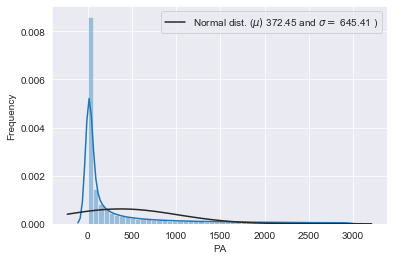

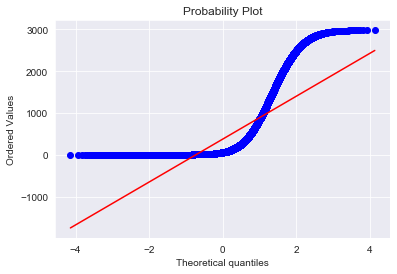

Dist Plot & QQ for: PB
**************************************************

 mu = 197.90 and sigma = 321.65



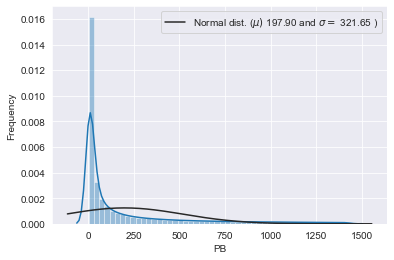

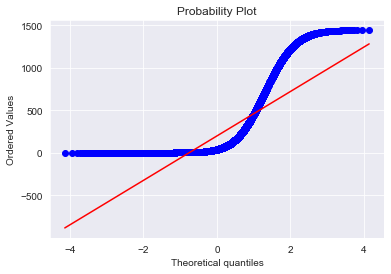

Dist Plot & QQ for: PC
**************************************************

 mu = 117.70 and sigma = 180.13



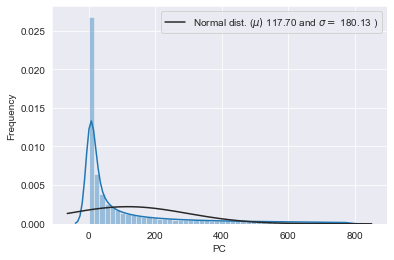

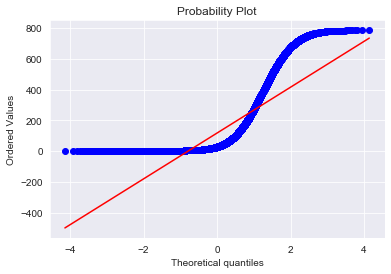

Dist Plot & QQ for: PD
**************************************************

 mu = 76.29 and sigma = 110.30



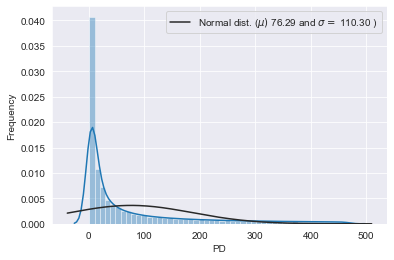

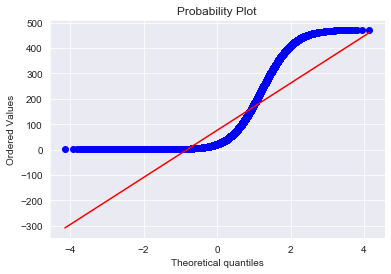

Dist Plot & QQ for: PE
**************************************************

 mu = 52.87 and sigma = 72.43



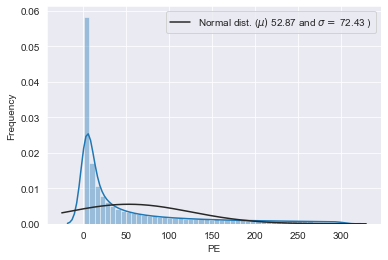

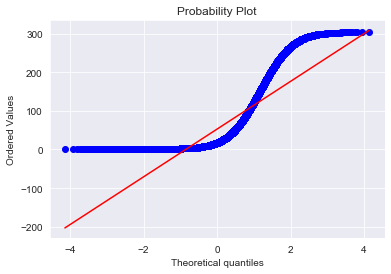

Dist Plot & QQ for: PF
**************************************************

 mu = 38.64 and sigma = 50.28



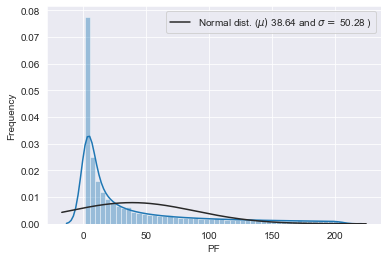

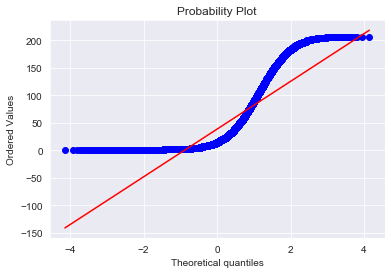

Dist Plot & QQ for: PG
**************************************************

 mu = 29.47 and sigma = 36.52



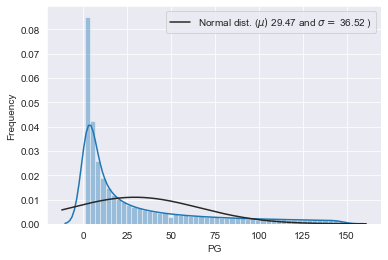

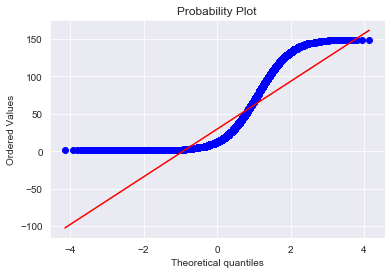

In [20]:
import seaborn as sns
sns.set_style('darkgrid')
import matplotlib.pyplot as plt
from scipy import stats
from scipy.stats import norm

cols = ['PA','PB','PC','PD','PE','PF','PG']

for c in cols:
    sns.distplot(data_train[c], fit=norm)

    (mu,sigma) = norm.fit(data_train[c])
    
    print("Dist Plot & QQ for:",c)
    print("*"*50)
    print('\n mu = {:.2f} and sigma = {:.2f}\n' .format(mu,sigma))

    plt.legend(['Normal dist. ($\mu)$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu,sigma)],loc='best')
    plt.ylabel('Frequency')
    plt.xlabel(c)
    
    fig=plt.figure()
    res=stats.probplot(data_train[c],plot=plt)
    plt.show()

##### Obervation:

1. All the target variables are right skewed. Applying log transformation on all the target variables to normalise the data

C:\Users\srila\AppData\Local\Programs\Python\Python36\Lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval


Dist Plot & QQ for: PA
**************************************************

 mu = 4.10 and sigma = 2.19



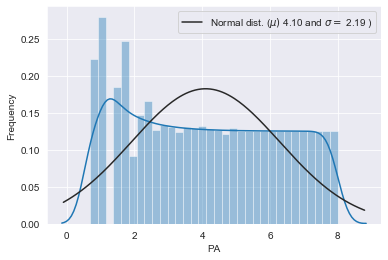

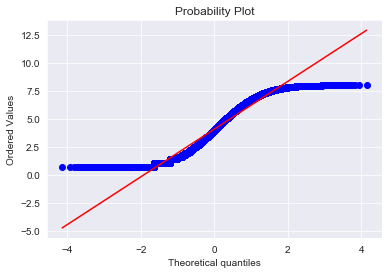

Dist Plot & QQ for: PB
**************************************************

 mu = 3.75 and sigma = 1.97



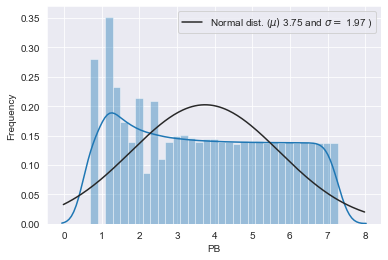

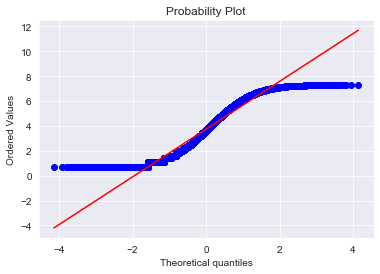

Dist Plot & QQ for: PC
**************************************************

 mu = 3.45 and sigma = 1.79



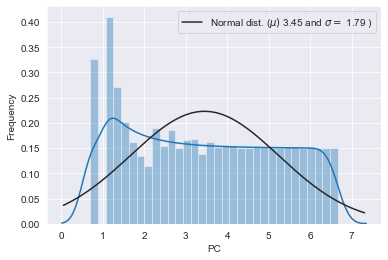

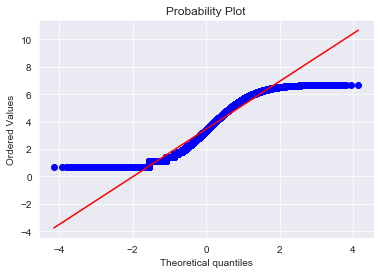

Dist Plot & QQ for: PD
**************************************************

 mu = 3.21 and sigma = 1.64



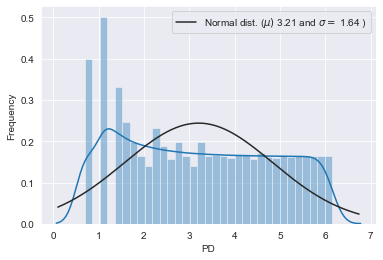

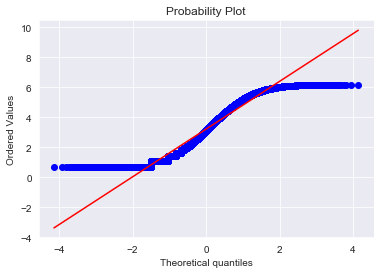

Dist Plot & QQ for: PE
**************************************************

 mu = 3.00 and sigma = 1.50



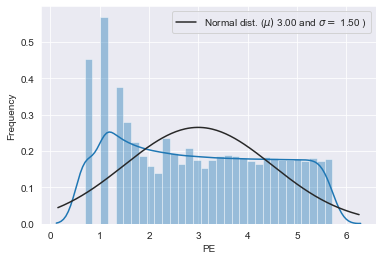

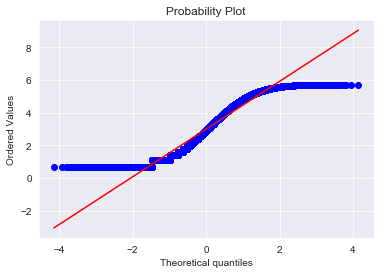

Dist Plot & QQ for: PF
**************************************************

 mu = 2.81 and sigma = 1.39



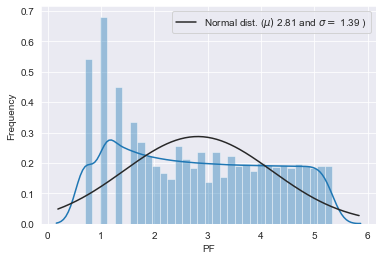

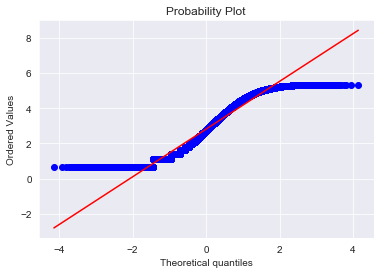

Dist Plot & QQ for: PG
**************************************************

 mu = 2.66 and sigma = 1.29



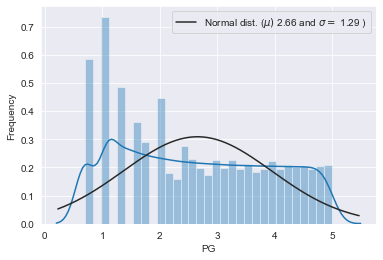

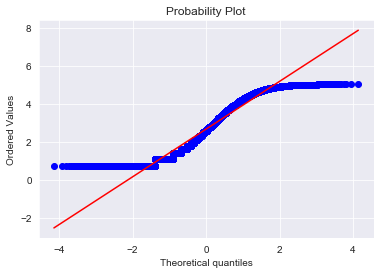

In [21]:
cols = ['PA','PB','PC','PD','PE','PF','PG']

for c in cols:
    
    data_train[c]=np.log1p(data_train[c])
    
    sns.distplot(data_train[c], fit=norm)

    (mu,sigma) = norm.fit(data_train[c])
    
    print("Dist Plot & QQ for:",c)
    print("*"*50)
    print('\n mu = {:.2f} and sigma = {:.2f}\n' .format(mu,sigma))

    plt.legend(['Normal dist. ($\mu)$ {:.2f} and $\sigma=$ {:.2f} )'.format(mu,sigma)],loc='best')
    plt.ylabel('Frequency')
    plt.xlabel(c)
    
    fig=plt.figure()
    res=stats.probplot(data_train[c],plot=plt)
    plt.show()

In [22]:
print(data_train.head(5))

            ID  TempOut  HiTemp  LowTemp  OutHum  DewPt  WindSpeed WindDir  \
25556  PR25557     54.2    54.4     54.1      85   49.8          3      SE   
25557  PR25558     53.7    54.1     53.7      86   49.6          3      SE   
25558  PR25559     53.3    53.7     53.3      87   49.5          3     SSE   
25559  PR25560     53.0    53.3     53.0      88   49.5          3     SSE   
25560  PR25561     52.9    53.0     52.8      88   49.4          3     SSE   

       WindRun  HiSpeed  ...       PB        PC        PD        PE        PF  \
25556     0.75        8  ...  4.65396  4.276666  3.951244  3.688879  3.433987   
25557     0.75        8  ...  4.65396  4.276666  3.951244  3.688879  3.433987   
25558     0.75        9  ...  4.65396  4.276666  3.951244  3.688879  3.433987   
25559     0.75        9  ...  4.65396  4.276666  3.951244  3.688879  3.433987   
25560     0.75        9  ...  4.65396  4.276666  3.951244  3.688879  3.433987   

             PG                Date  Year  M

#### Categorical variables WindDir, HiDir, ISSRecpt, Year of train & test

In [23]:
print(data_train['WindDir'].value_counts())

SSE    9870
---    6625
S      4513
SW     3842
WSW    2567
SE     2188
SSW    1860
WNW    1609
W      1549
N      1172
NW     1148
ESE     724
NNW     714
ENE     508
E       494
NNE     320
NE      297
Name: WindDir, dtype: int64


In [24]:
print(data_test['WindDir'].value_counts())

SSE    4653
---    3854
S      2463
SW     1733
SE     1580
WSW    1276
SSW    1148
W       985
NW      844
WNW     801
ESE     712
N       596
E       566
NNW     466
ENE     462
NNE     171
NE      136
Name: WindDir, dtype: int64


In [25]:
print(data_train['HiDir'].value_counts())

SSE    8470
---    6624
S      3862
SW     3313
WSW    2968
SE     2745
SSW    2551
W      2051
N      1444
WNW    1408
NW     1066
ESE    1056
NNW     941
E       534
ENE     419
NNE     321
NE      227
Name: HiDir, dtype: int64


In [26]:
print(data_test['HiDir'].value_counts())

SSE    4367
---    3854
S      2241
SE     1704
SW     1468
WSW    1463
SSW    1319
W      1144
ESE     818
WNW     771
N       763
NW      713
NNW     608
E       491
ENE     418
NNE     167
NE      137
Name: HiDir, dtype: int64


In [27]:
print(data_train['ISSRecpt'].value_counts())

100.0    39985
94.4        10
94.7         5
Name: ISSRecpt, dtype: int64


In [28]:
print(data_test['ISSRecpt'].value_counts())

100.0    22437
94.4         5
94.7         3
95.0         1
Name: ISSRecpt, dtype: int64


In [29]:
print(data_train['Year'].value_counts())

2041    20729
2040    17663
2042     1608
Name: Year, dtype: int64


In [30]:
print(data_test['Year'].value_counts())

2041    14307
2042     8139
Name: Year, dtype: int64


In [31]:
cols=('HiDir','WindDir','ISSRecpt','Year')
for c in cols:
    dum = pd.get_dummies(data_train[c],prefix=c)
    data_train = pd.concat([data_train,dum],axis=1)        
    data_train.drop([c],axis=1,inplace=True)
        
print(data_train.columns)

Index(['ID', 'TempOut', 'HiTemp', 'LowTemp', 'OutHum', 'DewPt', 'WindSpeed',
       'WindRun', 'HiSpeed', 'WindChill', 'HeatIndex', 'THWIndex', 'Bar',
       'Rain', 'RainRate', 'HeatDD', 'CoolDD', 'InTemp', 'InHum', 'InDew',
       'InHeat', 'InEMC', 'InAirDensity', 'WindSamp', 'WindTx', 'ArcInt', 'PA',
       'PB', 'PC', 'PD', 'PE', 'PF', 'PG', 'Date', 'Month', 'Day', 'HiDir_---',
       'HiDir_E', 'HiDir_ENE', 'HiDir_ESE', 'HiDir_N', 'HiDir_NE', 'HiDir_NNE',
       'HiDir_NNW', 'HiDir_NW', 'HiDir_S', 'HiDir_SE', 'HiDir_SSE',
       'HiDir_SSW', 'HiDir_SW', 'HiDir_W', 'HiDir_WNW', 'HiDir_WSW',
       'WindDir_---', 'WindDir_E', 'WindDir_ENE', 'WindDir_ESE', 'WindDir_N',
       'WindDir_NE', 'WindDir_NNE', 'WindDir_NNW', 'WindDir_NW', 'WindDir_S',
       'WindDir_SE', 'WindDir_SSE', 'WindDir_SSW', 'WindDir_SW', 'WindDir_W',
       'WindDir_WNW', 'WindDir_WSW', 'ISSRecpt_94.4', 'ISSRecpt_94.7',
       'ISSRecpt_100.0', 'Year_2040', 'Year_2041', 'Year_2042'],
      dtype='object')


In [32]:
cols=('HiDir','WindDir','ISSRecpt','Year')
for c in cols:
    dum = pd.get_dummies(data_test[c],prefix=c)
    data_test = pd.concat([data_test,dum],axis=1)        
    data_test.drop([c],axis=1,inplace=True)
        
print(data_test.columns)

Index(['ID', 'TempOut', 'HiTemp', 'LowTemp', 'OutHum', 'DewPt', 'WindSpeed',
       'WindRun', 'HiSpeed', 'WindChill', 'HeatIndex', 'THWIndex', 'Bar',
       'Rain', 'RainRate', 'HeatDD', 'CoolDD', 'InTemp', 'InHum', 'InDew',
       'InHeat', 'InEMC', 'InAirDensity', 'WindSamp', 'WindTx', 'ArcInt',
       'Date', 'Month', 'Day', 'HiDir_---', 'HiDir_E', 'HiDir_ENE',
       'HiDir_ESE', 'HiDir_N', 'HiDir_NE', 'HiDir_NNE', 'HiDir_NNW',
       'HiDir_NW', 'HiDir_S', 'HiDir_SE', 'HiDir_SSE', 'HiDir_SSW', 'HiDir_SW',
       'HiDir_W', 'HiDir_WNW', 'HiDir_WSW', 'WindDir_---', 'WindDir_E',
       'WindDir_ENE', 'WindDir_ESE', 'WindDir_N', 'WindDir_NE', 'WindDir_NNE',
       'WindDir_NNW', 'WindDir_NW', 'WindDir_S', 'WindDir_SE', 'WindDir_SSE',
       'WindDir_SSW', 'WindDir_SW', 'WindDir_W', 'WindDir_WNW', 'WindDir_WSW',
       'ISSRecpt_94.4', 'ISSRecpt_94.7', 'ISSRecpt_95.0', 'ISSRecpt_100.0',
       'Year_2041', 'Year_2042'],
      dtype='object')


#### Removing ID,Date,ArcInt,WindTx,Labels fro Train & test data

In [33]:
label=data_train[['PA', 'PB', 'PC', 'PD','PE', 'PF', 'PG']]
train=data_train.drop(['ID','Date','PA', 'PB', 'PC', 'PD','PE', 'PF', 'PG','ArcInt','WindTx'],axis=1)
test=data_test.drop(['ID','Date','ArcInt','WindTx'],axis=1)
print("Train columns",train.columns)
print("Label columns",label.columns)
print("Test columns",test.columns)

Train columns Index(['TempOut', 'HiTemp', 'LowTemp', 'OutHum', 'DewPt', 'WindSpeed',
       'WindRun', 'HiSpeed', 'WindChill', 'HeatIndex', 'THWIndex', 'Bar',
       'Rain', 'RainRate', 'HeatDD', 'CoolDD', 'InTemp', 'InHum', 'InDew',
       'InHeat', 'InEMC', 'InAirDensity', 'WindSamp', 'Month', 'Day',
       'HiDir_---', 'HiDir_E', 'HiDir_ENE', 'HiDir_ESE', 'HiDir_N', 'HiDir_NE',
       'HiDir_NNE', 'HiDir_NNW', 'HiDir_NW', 'HiDir_S', 'HiDir_SE',
       'HiDir_SSE', 'HiDir_SSW', 'HiDir_SW', 'HiDir_W', 'HiDir_WNW',
       'HiDir_WSW', 'WindDir_---', 'WindDir_E', 'WindDir_ENE', 'WindDir_ESE',
       'WindDir_N', 'WindDir_NE', 'WindDir_NNE', 'WindDir_NNW', 'WindDir_NW',
       'WindDir_S', 'WindDir_SE', 'WindDir_SSE', 'WindDir_SSW', 'WindDir_SW',
       'WindDir_W', 'WindDir_WNW', 'WindDir_WSW', 'ISSRecpt_94.4',
       'ISSRecpt_94.7', 'ISSRecpt_100.0', 'Year_2040', 'Year_2041',
       'Year_2042'],
      dtype='object')
Label columns Index(['PA', 'PB', 'PC', 'PD', 'PE', 'PF', 'PG'], dty

In [34]:
x_train,x_test=train,test
y_train=label
print("Data Train, Test shapes:",x_train.shape,x_test.shape)
print("Label Train, Test shapes:",y_train.shape)

Data Train, Test shapes: (40000, 65) (22446, 65)
Label Train, Test shapes: (40000, 7)


In [35]:
print(x_train.head(5))

       TempOut  HiTemp  LowTemp  OutHum  DewPt  WindSpeed  WindRun  HiSpeed  \
25556     54.2    54.4     54.1      85   49.8          3     0.75        8   
25557     53.7    54.1     53.7      86   49.6          3     0.75        8   
25558     53.3    53.7     53.3      87   49.5          3     0.75        9   
25559     53.0    53.3     53.0      88   49.5          3     0.75        9   
25560     52.9    53.0     52.8      88   49.4          3     0.75        9   

       WindChill  HeatIndex  ...  WindDir_SW  WindDir_W  WindDir_WNW  \
25556       54.2       54.1  ...           0          0            0   
25557       53.7       53.6  ...           0          0            0   
25558       53.3       53.3  ...           0          0            0   
25559       53.0       53.0  ...           0          0            0   
25560       52.9       52.9  ...           0          0            0   

       WindDir_WSW  ISSRecpt_94.4  ISSRecpt_94.7  ISSRecpt_100.0  Year_2040  \
25556        

In [36]:
print(x_test.head(5))

   TempOut  HiTemp  LowTemp  OutHum  DewPt  WindSpeed  WindRun  HiSpeed  \
0     82.6    83.6     80.8      38   54.4          4      1.0        9   
1     82.6    83.2     82.1      36   52.9          4      1.0       11   
2     83.6    84.5     82.4      38   55.3          4      1.0       11   
3     85.1    85.5     83.4      37   55.9          4      1.0       11   
4     86.5    87.3     85.1      37   57.1          4      1.0       10   

   WindChill  HeatIndex  ...  WindDir_SW  WindDir_W  WindDir_WNW  WindDir_WSW  \
0       82.6       81.8  ...           0          0            0            0   
1       82.6       81.5  ...           0          0            0            0   
2       83.6       83.3  ...           0          0            0            0   
3       85.1       84.7  ...           0          0            0            0   
4       86.5       86.2  ...           0          0            0            0   

   ISSRecpt_94.4  ISSRecpt_94.7  ISSRecpt_95.0  ISSRecpt_100.0

### Checking Skewness of features in train & test data

In [37]:
from scipy.stats import norm, skew 
num_feat = x_train.dtypes[x_train.dtypes != "object"].index

#Check the skew of all the features
skewed_feats = x_train[num_feat].apply(lambda x: skew(x.dropna()))
print("\n Skew in numerical features: \n")
skewness = pd.DataFrame({'Skew' : skewed_feats})
skewness.sort_values('Skew',ascending=False,inplace=True)
print(skewness)


 Skew in numerical features: 

                     Skew
ISSRecpt_94.7   89.425948
ISSRecpt_94.4   63.221834
RainRate        47.626123
Rain            14.168213
HiDir_NE        13.161199
WindDir_NE      11.475522
WindDir_NNE     11.045726
HiDir_NNE       11.028086
HiDir_ENE        9.616443
WindDir_E        8.830864
WindDir_ENE      8.703621
HiDir_E          8.480560
WindDir_NNW      7.282897
WindDir_ESE      7.229596
HiDir_NNW        6.287453
HiDir_ESE        5.908122
HiDir_NW         5.877996
WindDir_NW       5.645596
WindDir_N        5.582103
HiDir_WNW        5.044361
HiDir_N          4.973759
WindDir_W        4.781568
Year_2042        4.681614
WindDir_WNW      4.679965
WindDir_SSW      4.307452
HiDir_W          4.068996
WindDir_SE       3.916555
HiDir_SSW        3.570468
WindDir_WSW      3.556820
HiDir_SE         3.412569
...                   ...
WindDir_S        2.447541
HiDir_---        1.799198
WindDir_---      1.798955
HiDir_SSE        1.411093
WindDir_SSE      1.174847
WindSp

In [38]:
#https://www.kaggle.com/serigne/stacked-regressions-top-4-on-leaderboard
from scipy.stats import norm, skew 
num_feat = x_test.dtypes[x_test.dtypes != "object"].index

#Check the skew of all the features
skewed_feats = x_test[num_feat].apply(lambda x: skew(x.dropna()))
print("\n Skew in numerical features: \n")
skewness_test = pd.DataFrame({'Skew' : skewed_feats})
skewness_test.sort_values('Skew',ascending=False,inplace=True)
print(skewness_test)


 Skew in numerical features: 

                      Skew
ISSRecpt_95.0   149.809880
WindSamp        127.747901
RainRate         93.757606
ISSRecpt_94.7    86.481213
ISSRecpt_94.4    66.979103
WindDir_NE       12.729894
HiDir_NE         12.682490
Rain             12.354415
HiDir_NNE        11.463624
WindDir_NNE      11.325671
HiDir_ENE         7.121625
WindDir_ENE       6.753179
WindDir_NNW       6.722245
HiDir_E           6.537372
WindDir_E         6.056659
WindDir_N         5.889682
HiDir_NNW         5.826286
WindDir_ESE       5.343972
HiDir_NW          5.339838
HiDir_N           5.143275
HiDir_WNW         5.113552
WindDir_WNW       5.005944
HiDir_ESE         4.947516
WindDir_NW        4.861467
WindDir_W         4.453506
HiDir_W           4.083422
WindDir_SSW       4.075066
WindDir_WSW       3.827686
HiDir_SSW         3.752315
HiDir_WSW         3.523091
...                    ...
HiDir_S           2.669640
WindDir_S         2.497305
WindDir_---       1.741084
HiDir_---         1.741

### Applying BoxCox transformation to convert highly skewed variables to symmetric variables
If skewness is between -0.5 and 0.5, the distribution is approximately symmetric.
A Box Cox transformation is a way to transform non-normal dependent variables into a normal shape

In [39]:
from scipy.special import boxcox1p

pskew=0.5

skew=skewness[abs(skewness) > 0.5]

skew_feat=skew.index
for feat in skew_feat:
    x_train[feat] = boxcox1p(x_train[feat],pskew)

In [40]:
from scipy.special import boxcox1p

pskew=0.5

skew=skewness_test[abs(skewness) > 0.5]

skew_feat=skew.index
for feat in skew_feat:
    x_test[feat] = boxcox1p(x_test[feat],pskew)

In [41]:
print(x_train.head(5))

         TempOut     HiTemp    LowTemp     OutHum      DewPt  WindSpeed  \
25556  12.859340  12.886235  12.845875  16.547237  12.254824        2.0   
25557  12.791890  12.845875  12.791890  16.654758  12.226735        2.0   
25558  12.737707  12.791890  12.737707  16.761663  12.212670        2.0   
25559  12.696938  12.737707  12.696938  16.867962  12.212670        2.0   
25560  12.683324  12.696938  12.669697  16.867962  12.198591        2.0   

        WindRun   HiSpeed  WindChill  HeatIndex  ...  WindDir_SW  WindDir_W  \
25556  0.645751  4.000000  12.859340  12.845875  ...         0.0        0.0   
25557  0.645751  4.000000  12.791890  12.778363  ...         0.0        0.0   
25558  0.645751  4.324555  12.737707  12.737707  ...         0.0        0.0   
25559  0.645751  4.324555  12.696938  12.696938  ...         0.0        0.0   
25560  0.645751  4.324555  12.683324  12.683324  ...         0.0        0.0   

       WindDir_WNW  WindDir_WSW  ISSRecpt_94.4  ISSRecpt_94.7  ISSRecpt_10

In [42]:
print(x_test.head(5))

     TempOut     HiTemp    LowTemp     OutHum      DewPt  WindSpeed   WindRun  \
0  16.286607  16.395652  16.088670  10.489996  12.886235   2.472136  0.828427   
1  16.286607  16.352112  16.231840  10.165525  12.683324   2.472136  0.828427   
2  16.395652  16.493242  16.264720  10.489996  13.006665   2.472136  0.828427   
3  16.558017  16.601075  16.373895  10.328828  13.086418   2.472136  0.828427   
4  16.708287  16.793616  16.558017  10.328828  13.244671   2.472136  0.828427   

    HiSpeed  WindChill  HeatIndex  ...  WindDir_SW  WindDir_W  WindDir_WNW  \
0  4.324555  16.286607  16.198901  ...         0.0        0.0          0.0   
1  4.928203  16.286607  16.165902  ...         0.0        0.0          0.0   
2  4.928203  16.395652  16.363006  ...         0.0        0.0          0.0   
3  4.928203  16.558017  16.514859  ...         0.0        0.0          0.0   
4  4.633250  16.708287  16.676188  ...         0.0        0.0          0.0   

   WindDir_WSW  ISSRecpt_94.4  ISSRecpt_94.7

#### Standardizing Numerical Features

Year_2040 is present in train data but not in test data
ISSRecpt_95.0 is present in test data but not in train data
So vectorizing the numerical features separately

In [43]:
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

numerical_cols = list(x_train.columns)

vectorizer = StandardScaler()
vectorizer.fit(x_train[numerical_cols])
x_train[numerical_cols] = vectorizer.transform(x_train[numerical_cols])

In [44]:
from sklearn.preprocessing import StandardScaler
import warnings
warnings.filterwarnings("ignore")

numerical_cols = list(x_test.columns)

vectorizer = StandardScaler()
vectorizer.fit(x_test[numerical_cols])
x_test[numerical_cols] = vectorizer.transform(x_test[numerical_cols])

In [45]:
print(x_train.head(5))

        TempOut    HiTemp   LowTemp    OutHum     DewPt  WindSpeed   WindRun  \
25556 -0.316419 -0.332795 -0.291985  0.580653  0.237332   0.449869  0.374669   
25557 -0.359901 -0.358493 -0.327227  0.620548  0.213805   0.449869  0.374669   
25558 -0.394829 -0.392867 -0.362598  0.660215  0.202024   0.449869  0.374669   
25559 -0.421110 -0.427366 -0.389211  0.699657  0.202024   0.449869  0.374669   
25560 -0.429887 -0.453324 -0.406995  0.699657  0.190232   0.449869  0.374669   

        HiSpeed  WindChill  HeatIndex  ...  WindDir_SW  WindDir_W  \
25556  0.552661  -0.303132  -0.301339  ...   -0.325969  -0.200711   
25557  0.552661  -0.346408  -0.345668  ...   -0.325969  -0.200711   
25558  0.723627  -0.381172  -0.372363  ...   -0.325969  -0.200711   
25559  0.723627  -0.407329  -0.399131  ...   -0.325969  -0.200711   
25560  0.723627  -0.416064  -0.408071  ...   -0.325969  -0.200711   

       WindDir_WNW  WindDir_WSW  ISSRecpt_94.4  ISSRecpt_94.7  ISSRecpt_100.0  \
25556    -0.204721     

In [46]:
print(x_test.head(5))

    TempOut    HiTemp   LowTemp    OutHum     DewPt  WindSpeed   WindRun  \
0  2.368805  2.377590  2.296084 -1.912951  0.882066   0.940603  0.896965   
1  2.368805  2.347418  2.397873 -2.037540  0.727143   0.940603  0.896965   
2  2.445331  2.445218  2.421249 -1.912951  0.974014   0.940603  0.896965   
3  2.559276  2.519944  2.498868 -1.974836  1.034906   0.940603  0.896965   
4  2.664732  2.653370  2.629772 -1.974836  1.155733   0.940603  0.896965   

    HiSpeed  WindChill  HeatIndex  ...  WindDir_SW  WindDir_W  WindDir_WNW  \
0  0.798668   2.371821   2.384027  ...   -0.289253  -0.214236     -0.19237   
1  1.115191   2.371821   2.360377  ...   -0.289253  -0.214236     -0.19237   
2  1.115191   2.447726   2.501635  ...   -0.289253  -0.214236     -0.19237   
3  1.115191   2.560747   2.610463  ...   -0.289253  -0.214236     -0.19237   
4  0.960532   2.665348   2.726082  ...   -0.289253  -0.214236     -0.19237   

   WindDir_WSW  ISSRecpt_94.4  ISSRecpt_94.7  ISSRecpt_95.0  ISSRecpt_100.

#### Random Forest Regressor

In [47]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.model_selection import GridSearchCV

n_estimators = [1000,1500,2000]
max_depth = [10,15,20]

random_grid = {'n_estimators' : n_estimators,
              'max_depth' : max_depth}
rf = RandomForestRegressor(max_features='sqrt')

In [55]:
print("Tuning hyper-parameters for ROC_AUC")
print("*"*50)
print()
clf = GridSearchCV(estimator = rf, param_grid = random_grid, cv = 10, n_jobs = -1, scoring='neg_mean_squared_error')
result=clf.fit(x_train,y_train)
    
print("Best Estimator:",clf.best_estimator_)
print("Best Score:",clf.best_score_)
print("Best Params:",clf.best_params_)

Tuning hyper-parameters for ROC_AUC
**************************************************

Best Estimator: RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=20,
                      max_features='sqrt', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=2000,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)
Best Score: -0.4455705285526442
Best Params: {'max_depth': 20, 'n_estimators': 2000}


In [48]:
rfr_score = pd.DataFrame()
rfr_score['ID'] = data_test['ID']

In [49]:
from sklearn.metrics import mean_squared_error

rfr=RandomForestRegressor(bootstrap=True, criterion='mse', max_depth=100,
                      max_features='sqrt', max_leaf_nodes=None,
                      min_impurity_decrease=0.0, min_impurity_split=None,
                      min_samples_leaf=1, min_samples_split=2,
                      min_weight_fraction_leaf=0.0, n_estimators=10000,
                      n_jobs=None, oob_score=False, random_state=None,
                      verbose=0, warm_start=False)

output_columns = ['PA','PB','PC','PD','PE','PF','PG']
for i in output_columns:
    y_train_l = y_train[i]
    #y_test_l = y_test[i]
    rfr.fit(x_train,y_train_l)
    test_predict = rfr.predict(x_test)
    train_predict=rfr.predict(x_train)
    print("RMSE scores for:",i)
    print("*"*50)
    #rmse_test=np.sqrt(mean_squared_error(y_test_l, test_predict))
    #print("Test RMSE is :",rmse_test)
    #score_test=max(0,(100 - rmse_test))
    #print("Test Score is:",score_test)
    rmse_train=np.sqrt(mean_squared_error(y_train_l, train_predict))
    print("Train RMSE is:",np.sqrt(mean_squared_error(y_train_l, train_predict)))
    score_train=max(0,(100 - rmse_train))
    print("Train Score is:",score_train)
    print("*"*50)
    rfr_score[i] = [ round(p,0) for p in test_predict]

RMSE scores for: PA
**************************************************
Train RMSE is: 0.10925271626781019
Train Score is: 99.8907472837322
**************************************************
RMSE scores for: PB
**************************************************
Train RMSE is: 0.09879153044873686
Train Score is: 99.90120846955126
**************************************************
RMSE scores for: PC
**************************************************
Train RMSE is: 0.09013950906962233
Train Score is: 99.90986049093038
**************************************************
RMSE scores for: PD
**************************************************
Train RMSE is: 0.08278083308490215
Train Score is: 99.9172191669151
**************************************************
RMSE scores for: PE
**************************************************
Train RMSE is: 0.07680280723387244
Train Score is: 99.92319719276612
**************************************************
RMSE scores for: PF
***************************

In [51]:
print(rfr_score)

           ID   PA   PB   PC   PD   PE   PF   PG
0     PR40001  7.0  6.0  6.0  5.0  5.0  5.0  4.0
1     PR40002  7.0  7.0  6.0  6.0  5.0  5.0  5.0
2     PR40003  7.0  7.0  6.0  6.0  5.0  5.0  4.0
3     PR40004  7.0  7.0  6.0  6.0  5.0  5.0  5.0
4     PR40005  7.0  6.0  6.0  5.0  5.0  5.0  4.0
5     PR40006  7.0  7.0  6.0  6.0  5.0  5.0  5.0
6     PR40007  7.0  7.0  6.0  6.0  5.0  5.0  5.0
7     PR40008  7.0  6.0  6.0  5.0  5.0  5.0  4.0
8     PR40009  7.0  7.0  6.0  6.0  5.0  5.0  5.0
9     PR40010  7.0  6.0  6.0  5.0  5.0  5.0  4.0
10    PR40011  7.0  7.0  6.0  6.0  5.0  5.0  5.0
11    PR40012  7.0  6.0  6.0  5.0  5.0  5.0  4.0
12    PR40013  7.0  6.0  6.0  5.0  5.0  4.0  4.0
13    PR40014  7.0  7.0  6.0  6.0  5.0  5.0  5.0
14    PR40015  7.0  6.0  6.0  5.0  5.0  4.0  4.0
15    PR40016  7.0  6.0  6.0  5.0  5.0  4.0  4.0
16    PR40017  7.0  6.0  6.0  5.0  5.0  4.0  4.0
17    PR40018  7.0  6.0  5.0  5.0  5.0  4.0  4.0
18    PR40019  7.0  6.0  5.0  5.0  5.0  4.0  4.0
19    PR40020  6.0  

In [8]:
rfr_score=pd.read_csv("Test_Labels.csv")

In [9]:
print(rfr_score)

            ID  PA  PB  PC  PD  PE  PF  PG
0      PR40001   7   6   6   5   5   5   4
1      PR40002   7   7   6   6   5   5   5
2      PR40003   7   7   6   6   5   5   4
3      PR40004   7   7   6   6   5   5   5
4      PR40005   7   6   6   5   5   5   4
5      PR40006   7   7   6   6   5   5   5
6      PR40007   7   7   6   6   5   5   5
7      PR40008   7   6   6   5   5   5   4
8      PR40009   7   7   6   6   5   5   5
9      PR40010   7   6   6   5   5   5   4
10     PR40011   7   7   6   6   5   5   5
11     PR40012   7   6   6   5   5   5   4
12     PR40013   7   6   6   5   5   4   4
13     PR40014   7   7   6   6   5   5   5
14     PR40015   7   6   6   5   5   4   4
15     PR40016   7   6   6   5   5   4   4
16     PR40017   7   6   6   5   5   4   4
17     PR40018   7   6   5   5   5   4   4
18     PR40019   7   6   5   5   5   4   4
19     PR40020   6   6   5   5   5   4   4
20     PR40021   7   6   5   5   5   4   4
21     PR40022   7   6   6   5   5   4   4
22     PR40

#### Converting the Test labels to the actual form as log(train_labels) were considered to train the model

https://docs.scipy.org/doc/numpy-1.15.0/reference/generated/numpy.expm1.html#numpy.expm1

In [10]:
cols = ['PA','PB','PC','PD','PE','PF','PG']

for c in cols:
    rfr_score[c]=np.exp(rfr_score[c])

print(rfr_score)
    

            ID           PA           PB          PC          PD          PE  \
0      PR40001  1096.633158   403.428793  403.428793  148.413159  148.413159   
1      PR40002  1096.633158  1096.633158  403.428793  403.428793  148.413159   
2      PR40003  1096.633158  1096.633158  403.428793  403.428793  148.413159   
3      PR40004  1096.633158  1096.633158  403.428793  403.428793  148.413159   
4      PR40005  1096.633158   403.428793  403.428793  148.413159  148.413159   
5      PR40006  1096.633158  1096.633158  403.428793  403.428793  148.413159   
6      PR40007  1096.633158  1096.633158  403.428793  403.428793  148.413159   
7      PR40008  1096.633158   403.428793  403.428793  148.413159  148.413159   
8      PR40009  1096.633158  1096.633158  403.428793  403.428793  148.413159   
9      PR40010  1096.633158   403.428793  403.428793  148.413159  148.413159   
10     PR40011  1096.633158  1096.633158  403.428793  403.428793  148.413159   
11     PR40012  1096.633158   403.428793

In [11]:
rfr_score.to_csv("test_labels_rfr_exp_1.csv")

In [12]:
test_labels=pd.read_csv("test_labels_rfr_exp_1.csv")
print(test_labels)

       Unnamed: 0       ID           PA           PB          PC          PD  \
0               0  PR40001  1096.633158   403.428793  403.428793  148.413159   
1               1  PR40002  1096.633158  1096.633158  403.428793  403.428793   
2               2  PR40003  1096.633158  1096.633158  403.428793  403.428793   
3               3  PR40004  1096.633158  1096.633158  403.428793  403.428793   
4               4  PR40005  1096.633158   403.428793  403.428793  148.413159   
5               5  PR40006  1096.633158  1096.633158  403.428793  403.428793   
6               6  PR40007  1096.633158  1096.633158  403.428793  403.428793   
7               7  PR40008  1096.633158   403.428793  403.428793  148.413159   
8               8  PR40009  1096.633158  1096.633158  403.428793  403.428793   
9               9  PR40010  1096.633158   403.428793  403.428793  148.413159   
10             10  PR40011  1096.633158  1096.633158  403.428793  403.428793   
11             11  PR40012  1096.633158 

#### XGBRegressor

In [ ]:
import xgboost as xgb

# initialize Our first XGBoost model...
xgbr = xgb.XGBRegressor(silent=False, random_state=15)
#regr = MultiOutputRegressor(regr1)

# declare parameters for hyperparameter tuning
parameters = {'learning_rate':[0.001,0.01,0.1,0.15,0.2],'n_estimators':[100,300,500,700,900,1100],'max_depth':[1,3,5,7,9,11]} 

# Perform cross validation 
clf = GridSearchCV(xgbr,
                    param_grid = parameters,
                    scoring="neg_mean_squared_error",
                    cv=10,
                    n_jobs = -1,
                    verbose = 1)

output_columns = ['PA','PB','PC','PD','PE','PF','PG']
for i in output_columns:
    y_train_l = y_train[i]
    result = clf.fit(x_train, y_train_l)
    print("Best Parameters for:",i)
    print("*"*50)
    print("Best Estimator:",clf.best_estimator_)
    print("Best Score:",clf.best_score_)
    print("Best Params:",clf.best_params_)
    print("*"*50)

Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  1.1min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 20.5min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 70.3min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 144.6min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed: 217.5min
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed: 306.7min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed: 310.6min finished


[01:58:55] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Best Parameters for: PA
**************************************************
Best Estimator: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.2, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=15,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=False, subsample=1, verbosity=1)
Best Score: -0.6568829867599777
Best Params: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 1100}
**************************************************
Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 25.7min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 77.4min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 151.8min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed: 219.8min
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed: 305.9min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed: 310.8min finished


[07:11:07] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Best Parameters for: PB
**************************************************
Best Estimator: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.2, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=300,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=15,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=False, subsample=1, verbosity=1)
Best Score: -0.5413961437997731
Best Params: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 300}
**************************************************
Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  1.5min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 29.2min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 93.8min
[Parallel(n_jobs=-1)]: Done 776 tasks      | elapsed: 369.5min
[Parallel(n_jobs=-1)]: Done 1226 tasks      | elapsed: 440.8min
[Parallel(n_jobs=-1)]: Done 1776 tasks      | elapsed: 527.9min
[Parallel(n_jobs=-1)]: Done 1800 out of 1800 | elapsed: 531.2min finished


[16:02:46] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
Best Parameters for: PC
**************************************************
Best Estimator: XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.2, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=15,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=False, subsample=1, verbosity=1)
Best Score: -0.46863478185726026
Best Params: {'learning_rate': 0.2, 'max_depth': 3, 'n_estimators': 1100}
**************************************************
Fitting 10 folds for each of 180 candidates, totalling 1800 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 12 concurrent workers.
[Parallel(n_jobs=-1)]: Done  26 tasks      | elapsed:  1.2min
[Parallel(n_jobs=-1)]: Done 176 tasks      | elapsed: 22.6min
[Parallel(n_jobs=-1)]: Done 426 tasks      | elapsed: 74.0min


In [63]:
from sklearn.metrics import mean_squared_error
warnings.filterwarnings("ignore")
xgbr= xgb.XGBRegressor(base_score=0.5, booster='gbtree', colsample_bylevel=1,
             colsample_bynode=1, colsample_bytree=1, gamma=0,
             importance_type='gain', learning_rate=0.2, max_delta_step=0,
             max_depth=3, min_child_weight=1, missing=None, n_estimators=1100,
             n_jobs=1, nthread=None, objective='reg:linear', random_state=15,
             reg_alpha=0, reg_lambda=1, scale_pos_weight=1, seed=None,
             silent=False, subsample=1, verbosity=1)

output_columns = ['PA','PB','PC','PD','PE','PF','PG']
for i in output_columns:
    y_train_l = y_train[i]
    #y_test_l = y_test[i]
    xgbr.fit(x_train,y_train_l)
    #test_predict = xgbr.predict(x_test)
    train_predict=xgbr.predict(x_train)
    print("RMSE scores for:",i)
    print("*"*50)
    #rmse_test=np.sqrt(mean_squared_error(y_test_l, test_predict))
    #print("Test RMSE is :",rmse_test)
    #score_test=max(0,(100 - rmse_test))
    #print("Test Score is:",score_test)
    rmse_train=np.sqrt(mean_squared_error(y_train_l, train_predict))
    print("Train RMSE is:",np.sqrt(mean_squared_error(y_train_l, train_predict)))
    score_train=max(0,(100 - rmse_train))
    print("Train Score is:",score_train)
    print("*"*50)
    #xgb_scores[i] = [ round(p,0) for p in test_predict]

[23:17:45] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE scores for: PA
**************************************************
Train RMSE is: 0.10660801180184108
Train Score is: 99.89339198819816
**************************************************
[23:19:02] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE scores for: PB
**************************************************
Train RMSE is: 0.1042103775827623
Train Score is: 99.89578962241724
**************************************************
[23:20:19] WARNING: C:/Jenkins/workspace/xgboost-win64_release_0.90/src/objective/regression_obj.cu:152: reg:linear is now deprecated in favor of reg:squarederror.
RMSE scores for: PC
**************************************************
Train RMSE is: 0.08964215259470384
Train Score is: 99.91

#### Pretty Table

In [76]:
from prettytable import PrettyTable

t = PrettyTable()

t.field_names =  ["Model","Label", "RMSE", "score = max(0,(100 - rmse))"]

t.add_row(["Random Forest","PA",0.10,99.89])
t.add_row(["","PB",0.09,99.90])
t.add_row(["","PC",0.09,99.90])
t.add_row(["","PD",0.08,99.91])
t.add_row(["","PE",0.07,99.92])
t.add_row(["","PF",0.07,99.93])
t.add_row(["","PG",0.06,99.93])
t.add_row(["","","",""])
t.add_row(["XGBoost","PA",0.10,99.89])
t.add_row(["","PB",0.10,99.89])
t.add_row(["","PC",0.08,99.91])
t.add_row(["","PD",0.08,99.91])
t.add_row(["","PE",0.07,99.92])
t.add_row(["","PF",0.07,99.92])
t.add_row(["","PG",0.06,99.93])

print(t)

+---------------+-------+------+-----------------------------+
|     Model     | Label | RMSE | score = max(0,(100 - rmse)) |
+---------------+-------+------+-----------------------------+
| Random Forest |   PA  | 0.1  |            99.89            |
|               |   PB  | 0.09 |             99.9            |
|               |   PC  | 0.09 |             99.9            |
|               |   PD  | 0.08 |            99.91            |
|               |   PE  | 0.07 |            99.92            |
|               |   PF  | 0.07 |            99.93            |
|               |   PG  | 0.06 |            99.93            |
|               |       |      |                             |
|    XGBoost    |   PA  | 0.1  |            99.89            |
|               |   PB  | 0.1  |            99.89            |
|               |   PC  | 0.08 |            99.91            |
|               |   PD  | 0.08 |            99.91            |
|               |   PE  | 0.07 |            99.92      

### Summary on Feature engineered Model

1. Train & Test data provided in https://www.kaggle.com/shivammittal99/hackerearth-on-the-plague-trail was used to perform analyse and train the model.
2. No null  or missing values in the provided data.
3. Based on profilling report on value counts of each input variable, this data suffers with multicollinearity, highly skewed & contant data.
4. Target variables are highly skewed. 
5. https://www.kaggle.com/serigne/stacked-regressions-top-4-on-leaderboard - Learned and followed this link to deal with regression data and feature engineering of input variables to reduce RMSE and increase the scores (score = max(0,(100 - rmse))).
6. As the target variables are highly skewed with non-normal distribution, applied log normal transformation to make them normal distribution.
7. Input variables are highly skewed, using box cox transformation converted all the input variables to be within a skewness range of -0.5 to 0.5 so that all are symmetric.
8. Based on the profilling report, apart from WindDir & HiDir, Year, ISSRecpt can also be converted as categorical variables. Tried this as well as there are <5 unique values.
9. Extracted year, month day from date and removed ID,Date,WindTx,ArcInt (as these are constants).
10. Applied Random Forest & XGBoost model which improved the Scores for all the labels from (0-90) to (99.89-99.93) which is 0.07 less than the leaderboard score.https://www.hackerearth.com/challenges/competitive/on-the-plague-trail-hackerearth-machine-learning-challenge/leaderboard/on-the-plague-trail/
11. Random Forest model outperforms compared to all the models with the lowest RMSE and highest Score f 99.93.
12. Labels for test data is generated using Random Forest model and the same is displayed above and copied to csv file.